## citation
## Labeling https://www.youtube.com/watch?v=PPpKlPYL95c
## Labeling https://www.youtube.com/watch?v=AOosZVrTUbQ

## Point Cloud Collection: https://github.com/Waley-Z/ios-depth-point-cloud
## Intrinsic matrix mapping Lidar to 2D https://www.youtube.com/watch?v=nRVuLFQ_Bng
## https://www.youtube.com/watch?v=fVJeJMWZcq8

In [1]:
## pandas options
import pandas as pd
# np.set_printoptions(threshold=np.inf)
pd.set_option('display.max_rows', None)

# Visulization Libraries
import open3d as o3d
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.graph_objects as go
import cv2
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.patches as patches

#Clustering Libraries
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans



#### • getters; data proccessing 

In [2]:
def getXyxFromPly(file_name):
    pcd = o3d.io.read_point_cloud(file_name)
    xyz = np.asarray(pcd.points)
    return xyz

# use when camera was upside down taking the photo/lidar upside down
def getDFfromPLY_flipped(plyFileName):
    pcd = o3d.io.read_point_cloud(plyFileName)
    xyz = np.asarray(pcd.points)    
    df = pd.DataFrame(xyz, columns=['X', 'Y', 'Z'])

    df['x'] = pd.NA
    df['y'] = pd.NA
    x_count = 0
    y_count = 0
    x_dimension = 26
    y_dimension = 18
    for i, row in df.iloc[::-1].iterrows():
        # print(i)


        df.at[i, 'x'] = x_count%x_dimension + 1
        df.at[i, 'y'] = y_count
        x_count += 1
        if( (x_count%x_dimension) == 0 ):
            y_count += 1

        # print(i%x_dimension)
    return df

## use when image was taken normally
def getDFfromPLY(plyFileName):
    pcd = o3d.io.read_point_cloud(plyFileName)
    xyz = np.asarray(pcd.points)    
    df = pd.DataFrame(xyz, columns=['X', 'Y', 'Z'])

    df['x'] = pd.NA
    df['y'] = pd.NA
    x_count = 1
    y_count = 0
    x_dimension = 26
    y_dimension = 18
    for i, row in df.iterrows():
        # print(i)
        if( (i%x_dimension) == 0 ):
            y_count += 1
        df.at[i, 'x'] = i%x_dimension + 1
        df.at[i, 'y'] = y_count
        # print(i%x_dimension)
    return df

#### All the visualization methods are called show___()

In [3]:
def showImg(image_name):
    img = mpimg.imread(image_name)
    plt.imshow(img)  
    plt.axis('off')  
    plt.show()

def showPlotlyScatter(xyz_):
    fig = go.Figure(data=[go.Scatter3d(
        x=xyz_[:, 0], y=xyz_[:, 1], z=xyz_[:, 2],
        mode='markers',
        marker=dict(
            size=2,  
            color=xyz_[:, 2],  
            colorscale='viridis',
            opacity=0.8
        )
    )])
    
    # fig.update_layout(scene=dict(
    #     xaxis_title="X",
    #     yaxis_title="Y",
    #     zaxis_title="Z"
    # ))
    
    fig.update_layout(scene=dict(
        xaxis=dict(title="X", range=[xyz_[:, 0].max(), xyz_[:, 0].min()]),  # Flip X
        yaxis=dict(title="Y", range=[xyz_[:, 1].max(), xyz_[:, 1].min()]),  # Flip Y
        zaxis=dict(title="Z")
    ))
    
    fig.show()
    
def showPltScatter(xyz_):
    x = xyz_[:, 0]  # X-coordinates
    y = xyz_[:, 1]  # Y-coordinates
    z = xyz_[:, 2]  # color
    
    # Create scatter plot
    plt.scatter(x, y, c=z, cmap='viridis')
    plt.colorbar(label='Z value')  # color legend
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("2D Scatter Plot with Z as Color")
    
    plt.show()

def showGradientSeparated(img_address, vis = True, THRESHOLD = [150, 255]):
    # Load image
    image = cv2.imread(img_address)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # set threshold
    _, thresh = cv2.threshold(gray, THRESHOLD[0], THRESHOLD[1], cv2.THRESH_BINARY_INV)
    # Find contour
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # create blank image for labels
    labeled_image = np.zeros_like(image)
    
    # assign numeric labels
    for idx, cnt in enumerate(contours):
        cv2.drawContours(labeled_image, [cnt], -1, (idx+1, idx+1, idx+1), -1)  # Assign unique color
    
    
    
    # Convert BGR to RGB
    labeled_image_rgb = cv2.cvtColor(labeled_image, cv2.COLOR_BGR2RGB)

    # Display the img
    if (vis == True):        
        plt.figure(figsize=(8, 6))
        plt.imshow(labeled_image_rgb)
        plt.axis("off")
        plt.show()
        
    return labeled_image_rgb


def showProjection(df, img, invert=False, z = -1):
    # Create the figure and axis
    fig, ax = plt.subplots(figsize=(13, 9))
    
    # Scatter plot; had to play around with the variables. 
    #since the lidar points are divided into x,y grids, it has to be spot in the middle
    # hence the -.5 in the x and y
    # y coordinates had to be inverted because point cloud counts (left -> right ; up -> down), unlike a traditional graph
    # if (z == -1):
    scatter = ax.scatter((df['x']-.5), -(df['y']-.5) + 18, c=df['Z'], cmap='viridis', edgecolor='black')        
#     else:
#         scatter = ax.scatter((df['x']-.5), -(df['y']-.5) + 18, c=df['Z'], cmap='viridis', edgecolor='black')        
    
    # depth legend
    plt.colorbar(scatter, ax=ax, label='Z value')
    
    # labels
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_title("Scatter Plot with Background Image")
    
    
    
    # load anddisplay image
    background_img = mpimg.imread(img)
    ax.imshow(background_img, aspect='auto', extent=[0, 26, 0, 18], alpha=0.2)  # Adjust alpha for transparency

    if(invert == True):
        ax.invert_yaxis()
    
    ax.axis('on')
    plt.show()

def show3D(plyFileAddress):
    # Load a point cloud (replace with your own point cloud data)
    pcd = o3d.io.read_point_cloud(plyFileAddress)
    points = np.asarray(pcd.points)

    # Standardize the data
    scaler = StandardScaler()
    points_scaled = scaler.fit_transform(points)

    # Apply DBSCAN
    db = DBSCAN(eps=0.3, min_samples=10)
    labels = db.fit_predict(points_scaled)

    # Assign labels to the point cloud
    colors = plt.cm.viridis(labels / (labels.max() if labels.max() != 0 else 1))
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

    # Visualize the clustered point cloud
    o3d.visualization.draw_geometries([pcd])
    
    
def showDFplt(df, hue=None):
    ## Check if hue param
    if (hue == None):
        hue = df['Z']
    else: 
        pass
    
    # scatter plot
    plt.scatter(df['x'], df['y'], c=hue, cmap='viridis') 
    plt.colorbar(label='Z value') 
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("2D Scatter Plot with Z as Color")
    plt.gca().invert_yaxis()
    plt.show()
    
    
## Simple depth show
def showSimpleOverlay(image_address, ply_address, distance_thresh):
    rcnn_ = RCNN(distance_thresh)
    rcnn_.loadImage(image_address)
    rcnn_.display(getDFfromPLY(ply_address))


#### get clusters

In [4]:
## 2nd method of clustering labels with machine learning

def getClusters1(file_address):
    xyz = getXyxFromPly(file_address)
    X_train = xyz
    kmeans = KMeans(n_clusters=5)  # adjust to change mean (of the center)
    kmeans.fit(X_train)
    cluster_labels1 = kmeans.labels_
    cluster_labels1 =  cluster_labels1.tolist()
    return cluster_labels1

## 2nd method of clustering labels with machine learning
## This cluster promises noise filtering (min_sample > will be considered noise)
def getClusters2(file_address):
    xyz = getXyxFromPly(file_address)
    X_train = xyz
    db = DBSCAN(eps=0.05, min_samples=3)
    cluster_labels2 = db.fit_predict(X_train)
    cluster_labels2 = cluster_labels2.tolist()
    return cluster_labels2
## 3nd method of clustering labels with machine learning
## cluster 2, but for father away objects
def getClusters3(file_address):
    xyz = getXyxFromPly(file_address)
    X_train = xyz
    db = DBSCAN(eps=0.2, min_samples=4)
    cluster_labels2 = db.fit_predict(X_train)
    cluster_labels2 = cluster_labels2.tolist()
    return cluster_labels2

#### Class for image detection + overlay

In [5]:
class RCNN:
    def __init__(self, dist_threshold):
        self.model = model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()
        self.COCO_CLASSES = [
            'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
            'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
            'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie',
            'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
            'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
            'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
            'bed', 'N/A', 'dining table', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
            'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
            'toothbrush']
        self.img_tensor = None
        self.img = None
        self.dist_threshold = dist_threshold

    def loadImage(self, img_address):
        # load and process image
        self.img = Image.open(img_address)        
        transform = transforms.Compose([transforms.ToTensor()])
        self.img_tensor = transform(self.img)        

    ## Displays an overlay of 2 images
    ## img 1: mapping of lidar images
    ## img 2: RCNN prediction labels
    def display(self, DF, hue = None, hueStyle = 'viridis', uniqueCluster=False, flip = False):
        df = DF.copy()
        # print(df.head(3))
        # Make predictions
        with torch.no_grad():
            prediction = self.model([self.img_tensor])
    
        # Get the bounding boxes, labels, and scores
        boxes = prediction[0]['boxes']
        labels = prediction[0]['labels']
        scores = prediction[0]['scores']
        
        # print("df", df)
        # print("hue", hue)
        ## Add special hue if instructed        
        if (hue is None):
            hue = df['Z']
        else: 
            df_copy = df

            ##filter objects farther than .5 meters
            ##filter objects that are noise
            for i in range(len(hue)):
                if (hue[i] == -1) or (DF.iloc[i]['Z'] < self.dist_threshold):
                    df_copy.loc[i, 'x'] = np.nan= np.nan  # Set the entire row to NaN
                    df_copy.loc[i, 'y'] = np.nan= np.nan
                    ## if pram is given, hue is based on unique clusters
                if (uniqueCluster == True) and (hue[i] > -1):
                    # print("hi! replacing", df_copy.loc[i, 'Z'], "->", hue[i])
                    df_copy.loc[i, 'Z'] = hue[i]
                    # df_copy.loc[i, 'Z'] = 8

                        
            df = df_copy.copy()
            
        if (uniqueCluster == True):
            print(len(df))
            

        # Display
        fig, ax = plt.subplots(figsize=(13, 9))
        ## Different hueStyle options viridis, Greys, bwr, tab20
        ## tab20 recommended for unique clusters
        if (flip == True):
            scatter = ax.scatter( -((73.84*(df['x']-.5))-1920), -(((df['y']-.5)*80)-1440), c=df['Z'], cmap=hueStyle, edgecolor='black')
        else:     
            scatter = ax.scatter( ((73.84*(df['x']-.5))), (((df['y']-.5)*80)), c=df['Z'], cmap=hueStyle, edgecolor='black')
        # plt.imshow(self.img)
        ax.imshow(self.img)
        
        # ax.imshow(additional_layer_to_display, alpha=0.6)
        # ax = plt.gca()
        
        # depth legend
        plt.colorbar(scatter, ax=ax, label='Z value')
                
        ## Box and label Gen 
        for i, box in enumerate(boxes):
            label = labels[i].item()
            score = scores[i].item()
            
            if ((score > 0.5) and (COCO_CLASSES[label] == "car")):
                # Get the coords of the bounding box
                x_min, y_min, x_max, y_max = box.tolist()
                
                #Add box
                ax.add_patch(patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none'))
                
                #Add labels
                label_name = self.COCO_CLASSES[label]  # Get the class name from the label
                ax.text(x_min, y_min, f'{label_name} ({score:.2f})', color='white', fontsize=10,
                        bbox=dict(facecolor='red', alpha=0.5))
        
        plt.show()
    


#### Pipleline that integrates all methods above

In [6]:
def pipeline(img, ply, distance_threshold, DEPTH = False, FLIP = False):
    showImg(img)
    showPlotlyScatter(getXyxFromPly(ply))
    df_ = None
    if (FLIP is False):
        df_ = getDFfromPLY(ply)
    elif (FLIP is True):
        df_ = getDFfromPLY_flipped(ply)

    clusterLabels_ = getClusters1(ply)
    rcnn_ = RCNN(distance_threshold)
    rcnn_.loadImage(img)

    
    if DEPTH == True:
        rcnn_.display(df_, clusterLabels_, 'viridis', uniqueCluster=False, flip = FLIP)
    else: 
        rcnn_.display(df_, clusterLabels_, 'tab20', uniqueCluster=True)

In [7]:
# COCO class labels (for 80 classes)
COCO_CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
    'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie',
    'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
    'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
    'bed', 'N/A', 'dining table', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

In [8]:
pipeline?

Signature: pipeline(img, ply, distance_threshold, DEPTH=False, FLIP=False)
Docstring: <no docstring>
File:      /var/folders/7n/05f5jrgn1t111ckyjnlbnnj80000gn/T/ipykernel_38374/240131828.py
Type:      function

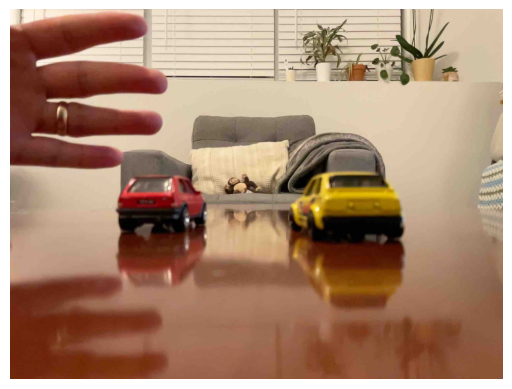

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



494


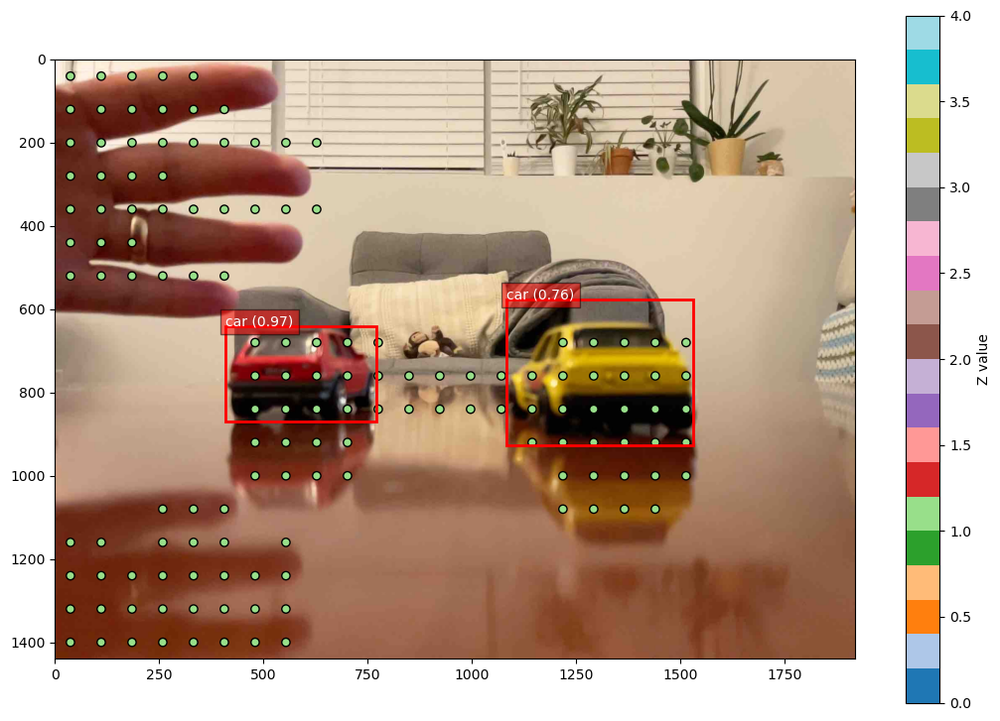

In [9]:
pipeline('./joint/carr.jpeg', './joint/carr.ply', -0.5, FLIP = True )

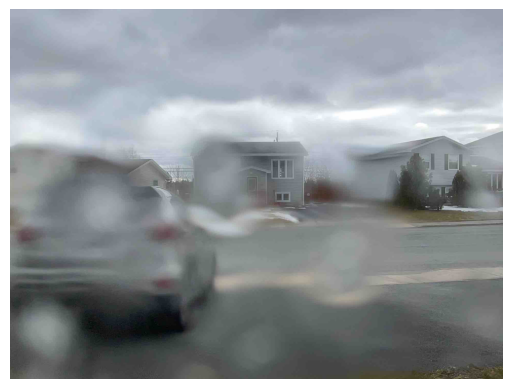

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



494


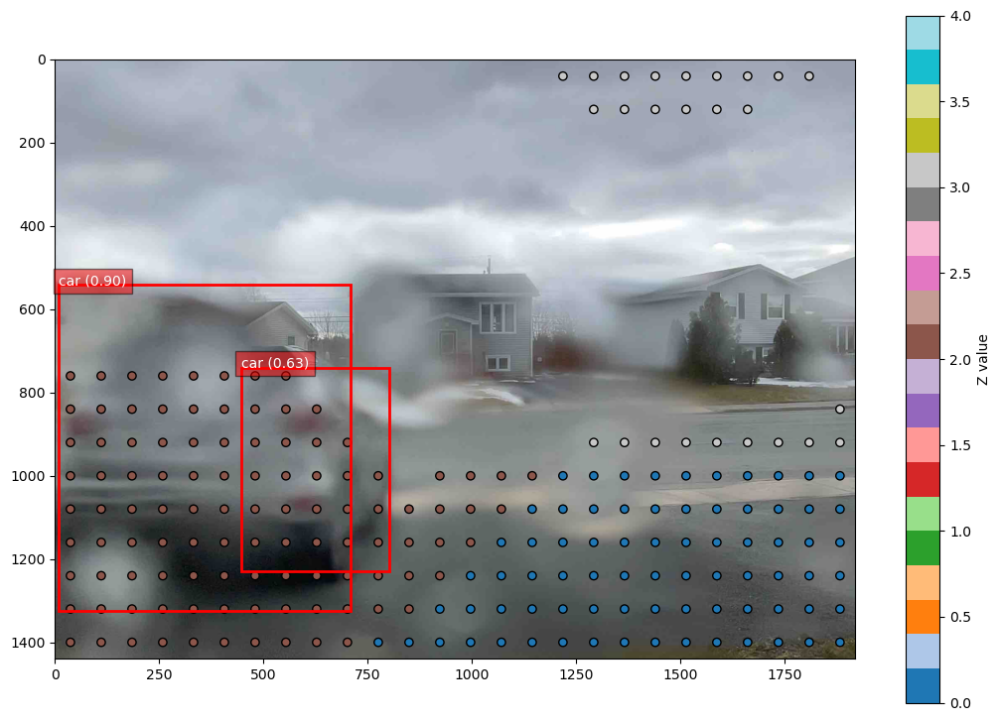

In [10]:
pipeline('./joint/moisture2.jpeg', './joint/moisture2.ply', -5)

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



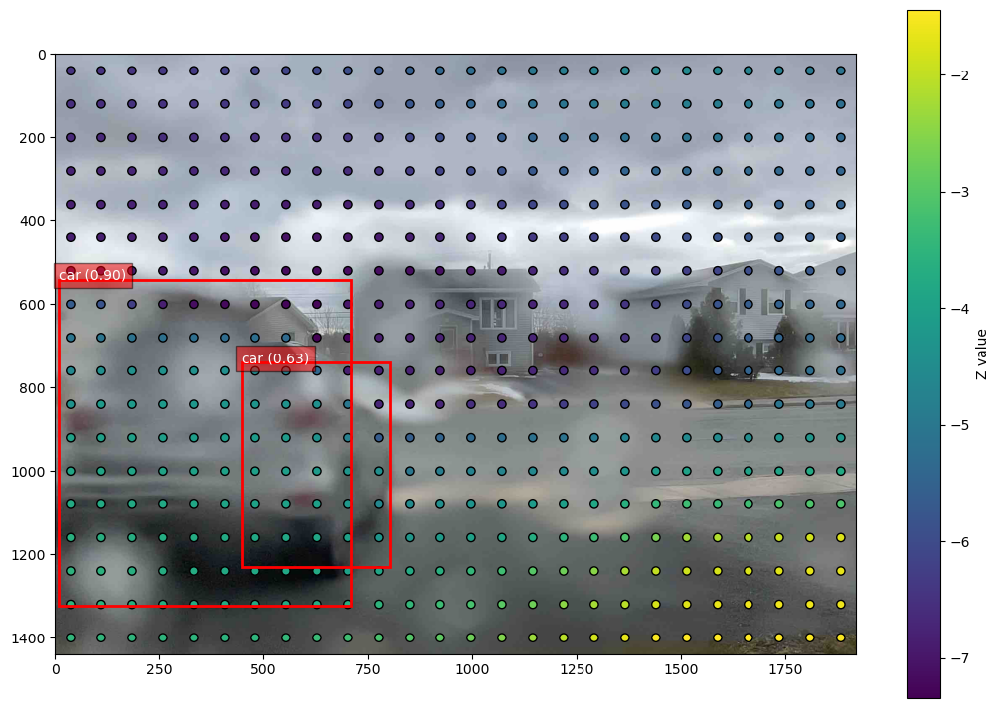

In [11]:
showSimpleOverlay('./joint/moisture2.jpeg', './joint/moisture2.ply', -2)

In [ ]:
pipeline('./joint/moisture2.jpeg', './joint/moisture2.ply', -5)